<a href="https://colab.research.google.com/github/aghosh92/DCNN_Ferroics/blob/main/ferroics_C.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Deep learning polarization data in ferroelectrics from STEM

STEM data parameterization and analysis : Christopher Nelson

Deep learning models training, implementation of feature maps, visualization of convolution layers, prepartion of notebooks: Ayana Ghosh

Simulation of BFO images as a function of specimen tilt: Mark Oxley

Framework, code developments: Maxim Ziatdinov, Sergei V. Kalinin


The goal of this study is to show how polarization  of bismuth ferrite (BFO) doped with five different Samarium (Sm) concentrations 
(0%, 7%, 10%, 13% and 20%) can be predicted using deep convolution neural networks (DCNNs) with and without atom finding. 


In particular it demonstrates:

(1) how to generate subimages that are ***centered around the atoms***,

(2) how a DCNN is trained on one of the images correponding to one Sm concentration and can be applied to the rest,

(3) how to construct feature maps, visualize convolution layers to get insights into DCNN operations.

Install AtomAI

In [ ]:
!pip install git+https://github.com/ziatdinovmax/atomai.git@maxdev

  Cloning https://github.com/ziatdinovmax/atomai.git (to revision maxdev) to /tmp/pip-req-build-30vk3d11
  Running command git clone -q https://github.com/ziatdinovmax/atomai.git /tmp/pip-req-build-30vk3d11
  Running command git checkout -b maxdev --track origin/maxdev
  Switched to a new branch 'maxdev'
  Branch 'maxdev' set up to track remote branch 'maxdev' from 'origin'.
     |████████████████████████████████| 194kB 12.7MB/s 
     |████████████████████████████████| 870kB 20.7MB/s 
  Created wheel for atomai: filename=atomai-0.6.2-cp37-none-any.whl size=126562 sha256=64380790892ab1fe5af240dfcca8ea6d1c09153624e5470bb53cfdb8d4678b78
  Stored in directory: /tmp/pip-ephem-wheel-cache-za7jrloj/wheels/e4/bf/54/eb0db24fe3c373d1f2f76d293e26cdaf06f6cdd3ac4e27f477
  Created wheel for mendeleev: filename=mendeleev-0.6.1-py2.py3-none-any.whl size=174964 sha256=83986f578b3c20ea1e907b8fc6d2cce7bfb684cb0ebb5f24943e007ba8f270ab
  Stored in directory: /root/.cache/pip/wheels/fb/28/5d/95e69a718b35dd0

In [ ]:
!pip install wget

  Created wheel for wget: filename=wget-3.2-cp37-none-any.whl size=9681 sha256=90500169ffae35de64ed169ad99978ed1c73b58b6bb37ced7f25d260ae65ed1c
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


If you would like to retrain the models (instead of using the ones provided), it may be a good idea to mount a google drive so that the models can be stored there during and at the end of training.

Import standard modules:

In [ ]:
import os
import numpy as np
import h5py
import matplotlib.pyplot as plt
import atomai as aoi
np.random.seed(1)
import copy

import wget

from typing import Tuple, Union
import seaborn as sns

from scipy.spatial import cKDTree

import torch
import torch.nn as nn
import torch.nn.functional as F
from atomai.nets import ConvBlock

torch.set_default_tensor_type(torch.FloatTensor)

import torch.optim as optim
from torch.optim import Adam
from torchvision import models
from torch.utils.data import DataLoader
from torch.autograd import Variable

import torchvision.transforms as transforms
import torchvision.datasets as datasets
import copy
import torchvision

If you would like to retrain the models (instead of using the ones provided), it may be a good idea to mount a google drive so that the models can be stored there during and at the end of training.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Import Sm-doped BFO data (images and corresponding parameters for various Sm doping concentrations)

In [ ]:
%mkdir filedir

In [ ]:
%cd filedir

/content/filedir


In [ ]:
model_files = ['Sm_0_0_HAADF.h5','Sm_0_1_HAADF.h5','Sm_0_2_HAADF.h5',
               'Sm_0_0_UCParameterization.h5','Sm_0_1_UCParameterization.h5','Sm_0_2_UCParameterization.h5',
               'Sm_7_0_HAADF.h5','Sm_7_1_HAADF.h5', 'Sm_7_2_HAADF.h5', 'Sm_7_3_HAADF.h5', 'Sm_7_4_HAADF.h5',
               'Sm_7_0_UCParameterization.h5','Sm_7_1_UCParameterization.h5','Sm_7_2_UCParameterization.h5','Sm_7_3_UCParameterization.h5','Sm_7_4_UCParameterization.h5',
               'SM_10_0_HAADF.h5','Sm_10_1_HAADF.h5',
               'Sm_10_0_UCParameterization.h5','Sm_10_1_UCParameterization.h5',
               'Sm_13_0_HAADF.h5','Sm_13_1_HAADF.h5',
               'Sm_13_0_UCParameterization.h5','Sm_13_1_UCParameterization.h5',
               'Sm_20_0_HAADF.h5','Sm_20_1_HAADF.h5',
               'Sm_20_0_UCParameterization.h5','Sm_20_1_UCParameterization.h5']

for model_file in model_files:
  print(model_file)
  wget.download("https://zenodo.org/record/4555979/files/"+model_file+"?download=1", out=model_file)

Sm_0_0_HAADF.h5
Sm_0_1_HAADF.h5
Sm_0_2_HAADF.h5
Sm_0_0_UCParameterization.h5
Sm_0_1_UCParameterization.h5
Sm_0_2_UCParameterization.h5
Sm_7_0_HAADF.h5
Sm_7_1_HAADF.h5
Sm_7_2_HAADF.h5
Sm_7_3_HAADF.h5
Sm_7_4_HAADF.h5
Sm_7_0_UCParameterization.h5
Sm_7_1_UCParameterization.h5
Sm_7_2_UCParameterization.h5
Sm_7_3_UCParameterization.h5
Sm_7_4_UCParameterization.h5
SM_10_0_HAADF.h5
Sm_10_1_HAADF.h5
Sm_10_0_UCParameterization.h5
Sm_10_1_UCParameterization.h5
Sm_13_0_HAADF.h5
Sm_13_1_HAADF.h5
Sm_13_0_UCParameterization.h5
Sm_13_1_UCParameterization.h5
Sm_20_0_HAADF.h5
Sm_20_1_HAADF.h5
Sm_20_0_UCParameterization.h5
Sm_20_1_UCParameterization.h5


In [ ]:
dir_data = "/content/filedir"

Choose files of interest and view the corresponding image and available UC parameters:

In [ ]:
#image files
composition_tags = [0,0,0,7,7,7,7,7,10,10,13,13,20,20]    #Sm composition %


img_filename = ['Sm_0_0_HAADF.h5','Sm_0_1_HAADF.h5','Sm_0_2_HAADF.h5',
                'Sm_7_0_HAADF.h5','Sm_7_1_HAADF.h5', 'Sm_7_2_HAADF.h5', 'Sm_7_3_HAADF.h5', 'Sm_7_4_HAADF.h5',
                'SM_10_0_HAADF.h5','Sm_10_1_HAADF.h5',
                'Sm_13_0_HAADF.h5','Sm_13_1_HAADF.h5',
                'Sm_20_0_HAADF.h5','Sm_20_1_HAADF.h5']

imnum = len(img_filename)

#paramterization files

UCparam_filename = ['Sm_0_0_UCParameterization.h5','Sm_0_1_UCParameterization.h5','Sm_0_2_UCParameterization.h5',
                    'Sm_7_0_UCParameterization.h5','Sm_7_1_UCParameterization.h5','Sm_7_2_UCParameterization.h5','Sm_7_3_UCParameterization.h5','Sm_7_4_UCParameterization.h5',
                    'Sm_10_0_UCParameterization.h5','Sm_10_1_UCParameterization.h5',
                    'Sm_13_0_UCParameterization.h5','Sm_13_1_UCParameterization.h5',
                    'Sm_20_0_UCParameterization.h5','Sm_20_1_UCParameterization.h5']

#load parameter files
UCparam = []
for x in UCparam_filename:
  print('loading parameterization file: ', os.path.join(dir_data, x))
  temp = h5py.File(os.path.join(dir_data, x), 'r')
  UCparam.append(temp)

#load images
imgdata = []
for x in img_filename:
  print('loading image file: ', os.path.join(dir_data, x))
  temp = h5py.File(os.path.join(dir_data, x), 'r')['MainImage']
  imgdata.append(temp)
  
print('UC parameterization:', [k for k in UCparam[0].keys()])

loading parameterization file:  /content/filedir/Sm_0_0_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_0_1_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_0_2_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_7_0_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_7_1_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_7_2_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_7_3_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_7_4_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_10_0_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_10_1_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_13_0_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_13_1_UCParameterization.h5
loading parameterization file:  /content/filedir/Sm_20_0_UCP

In [ ]:
#function maps x,y grid positions into a matrix data format
def map2grid(inab, inVal):
  """
  # Inputs
      inab (ndarray): grid coordinates
      inab (ndarray): value @ given coordinate
  # Returns
      Valgrid: Value mapped to grid
      abrng: value boundaries of grid
  """
  default_val = np.nan
  abrng = [int(np.min(inab[:,0])), int(np.max(inab[:,0])), int(np.min(inab[:,1])), int(np.max(inab[:,1]))]
  abind = inab
  abind[:,0] -= abrng[0]
  abind[:,1] -= abrng[2]
  Valgrid = np.empty((abrng[1]-abrng[0]+1,abrng[3]-abrng[2]+1))
  Valgrid[:] = default_val
  Valgrid[abind[:,0].astype(int),abind[:,1].astype(int)]=inVal[:]
  return Valgrid, abrng

Convert to dictionary structure

In [ ]:
#convert to dictionary:
# adds an 'Index', 'Composition', and 'filename' key to each dataset dictionary in addition to UCparams.

SBFOdata = []                       #this will be the output list of dictionaries for each dataset
for i in np.arange(imnum):
  temp_dict = {'Index': i}
  temp_dict['Composition'] = composition_tags[i]
  temp_dict['Image'] = imgdata[i]
  temp_dict['Filename'] = img_filename[i]
  for k in UCparam[i].keys():       #add labels for UC parameterization
    temp_dict[k] = UCparam[i][k][()]

  #select values mapped to ab grid
  temp_dict['ab_a'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,0])[0]       #a array
  temp_dict['ab_b'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,1])[0]       #b array
  temp_dict['ab_x'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,0])[0]   #x array
  temp_dict['ab_y'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,1])[0]   #y array
  temp_dict['ab_Px'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][0])[0]             #Px array
  temp_dict['ab_Py'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][1])[0]             #Py array

  SBFOdata.append(temp_dict)        

Example for making UC parameter images (on ab lattice space)

In [ ]:
#Show available parameters & their dimensions
for k in UCparam[i].keys():
  print(k+' '+str(np.shape(UCparam[i][k])))

I1 (1, 18390)
I2 (1, 18390)
I3 (1, 18390)
I4 (1, 18390)
I5 (1, 18390)
NCOM (2, 18390)
PCOM (2, 18390)
Pxy (2, 18390)
Vol (1, 18390)
a (2, 18390)
ab (2, 18390)
adelta (2, 18390)
alpha (1, 18390)
atmindex (5, 18390)
b (2, 18390)
bdelta (2, 18390)
index (18390, 1)
meanuca (1, 3)
meanucb (1, 3)
nbrUC (4, 18390)
xy_COM (2, 18390)
xy_atms (2, 5, 18390)


...using original UCparam inputs

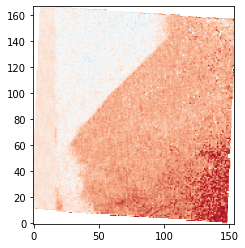

In [ ]:
i = 0     #image #
param_to_plot = 'Pxy'
elementnum = 0          #which dimension to use for image
                        #2 element, e.g. vectors: 'Pxy', 'a', 'b', 'abdelta' or positions: 'ab', 'xy_COM'
                        #1 element, e.g. 'I1'-'I5', 'Vol', 'alpha'

param_abimage = map2grid(UCparam[i]['ab'][()].T, UCparam[i][param_to_plot][elementnum])[0]
plt.imshow(param_abimage, origin='bottom', cmap='RdBu')

...using the new dictionary inputs

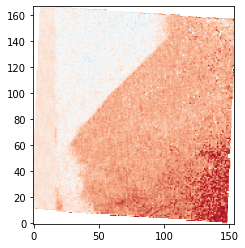

In [ ]:
i = 0     #image #
param_to_plot = 'Pxy'
elementnum = 0          #which dimension to use for image
                        #2 element, e.g. vectors: 'Pxy', 'a', 'b', 'abdelta' or positions: 'ab', 'xy_COM'
                        #1 element, e.g. 'I1'-'I5', 'Vol', 'alpha'
SBFOdata
param_abimage = map2grid(SBFOdata[i]['ab'].T, SBFOdata[i][param_to_plot][elementnum])[0]
plt.imshow(param_abimage, origin='bottom', cmap='RdBu')

Display

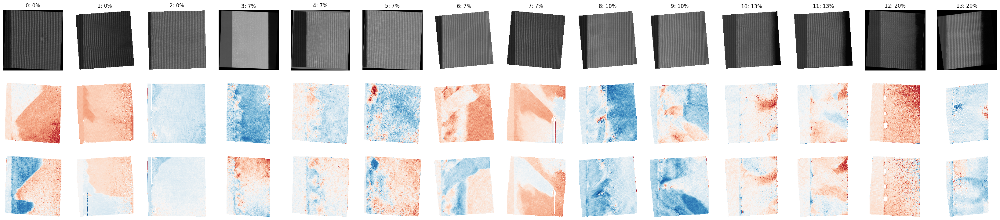

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=len(SBFOdata), figsize=(3*len(SBFOdata), 3*3), dpi=100)
for i, k in enumerate(SBFOdata):
  #Image
  ax[0,i].imshow(k['Image'], origin='bottom', cmap='gray')
  ax[0,i].set_title(str(k['Index'])+': '+str(k['Composition'])+'%')
  ax[0,i].set_axis_off()
  #Px
  ax[1,i].imshow(k['ab_Px'], origin='bottom', cmap='RdBu')
  ax[1,i].set_axis_off()
  #Py
  ax[2,i].imshow(k['ab_Py'], origin='bottom', cmap='RdBu')
  ax[2,i].set_axis_off()

In [ ]:
print('Dictionary items:', [k for k in SBFOdata[0].keys()])

Dictionary items: ['Index', 'Composition', 'Image', 'Filename', 'I1', 'I2', 'I3', 'I4', 'I5', 'NCOM', 'PCOM', 'Pxy', 'Vol', 'a', 'ab', 'adelta', 'alpha', 'atmindex', 'b', 'bdelta', 'index', 'meanuca', 'meanucb', 'nbrUC', 'xy_COM', 'xy_atms', 'ab_a', 'ab_b', 'ab_x', 'ab_y', 'ab_Px', 'ab_Py']


In [ ]:
#This function normalizes images between (0,1)
def normalize_image(img_2D_array):
  min_val = np.min(img_2D_array)
  max_val = np.max(img_2D_array)
  img_2D_array_norm = (img_2D_array - min_val)/(max_val - min_val)
  img_2D_array_norm = img_2D_array_norm 
  return img_2D_array_norm

In [ ]:
images = []

for i in range(14):
  img_local = np.array(SBFOdata[i]['Image'])
  idx_nan_img_local = np.where(np.isnan(img_local))
  idx_inf_img_local = np.where(np.isinf(img_local))

  if idx_nan_img_local[0].shape[0] > 0:
    img_local[idx_nan_img_local] = 0.0
  if idx_inf_img_local[0].shape[0] > 0:
    img_local[idx_inf_img_local] = 0.0

  img_local = normalize_image(img_local)
  images.append(img_local)

In [ ]:
#excluding image from 'images' at index[3]

images.pop(3)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
xy_COM_all = []

for i in range(14):
  xy_COM_local = SBFOdata[i]['xy_COM']
  xy_COM_local = np.transpose(xy_COM_local)
  xy_COM_all.append(xy_COM_local)

In [ ]:
#excluding image from 'xy_COM_all' at index[3]

xy_COM_all.pop(3)

array([[3272.63249648, 1578.30611643],
       [3272.72149202, 1591.41769436],
       [3260.0986185 , 1591.20413371],
       ...,
       [3115.63790316,  916.64410246],
       [3331.88636493,  916.61592276],
       [1249.12578838,  905.09739624]])

In [ ]:
Pxy_all = []

for i in range(14):
  Pxy_local = SBFOdata[i]['Pxy']
  Pxy_local = np.transpose(Pxy_local)
  Pxy_all.append(Pxy_local)

In [ ]:
Pxy_all.pop(3)

array([[ 0.61037034, -1.40310404],
       [ 1.28903486, -1.6639959 ],
       [ 0.96984486, -1.30566436],
       ...,
       [ 1.50001702,  0.29033019],
       [ 2.18947811, -1.22202986],
       [ 1.56000245,  0.05784968]])

Optional: 
Plot the images, coordinates and polarization overlayed.

In [ ]:
plot_list_xy = []
plot_list_P = []

for i in range(13):
  temp_array_xy = np.zeros(images[i].shape)
  temp_array_P = np.zeros(images[i].shape)

  for j in range(xy_COM_all[i].shape[0]):
    y = np.int(xy_COM_all[i][j][0])
    x = np.int(xy_COM_all[i][j][1])
    y_P = np.int(Pxy_all[i][j][0])
    x_P = np.int(Pxy_all[i][j][1])
    temp_array_xy[y][x] = 100.0               #this values is hard-coded only for plotting
    temp_array_P[y][x] = 6.0                  #this value is hard-coded only for plotting

  plot_list_xy.append(temp_array_xy)
  plot_list_P.append(temp_array_P)

In [ ]:
x_label_list = ['0% Sm', '0% Sm', '0% Sm', '7% Sm', '7% Sm', '7% Sm', '7% Sm', '10% Sm', '10% Sm', '13% Sm', '13% Sm', '20% Sm', '20% Sm'] 

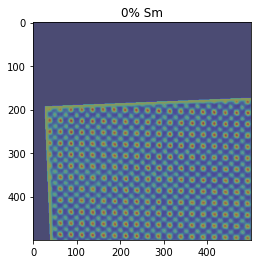

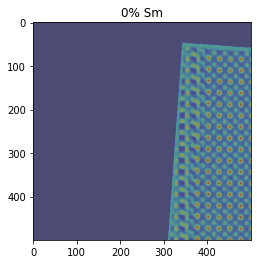

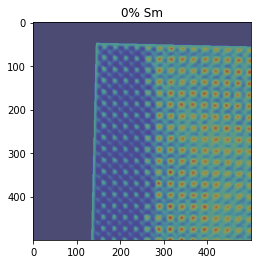

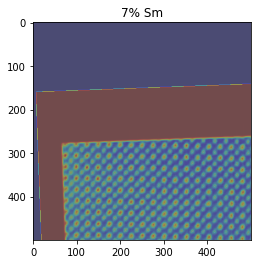

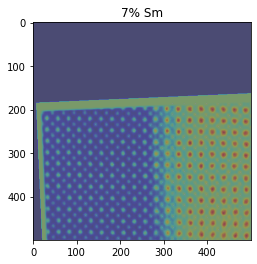

...

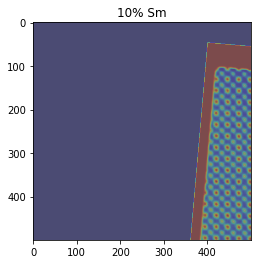

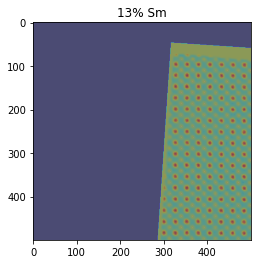

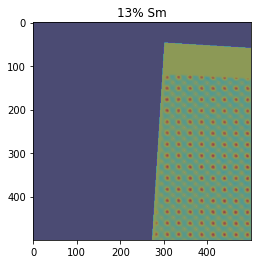

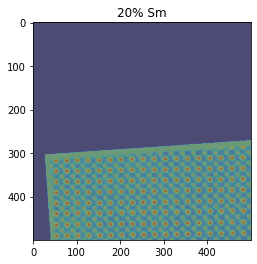

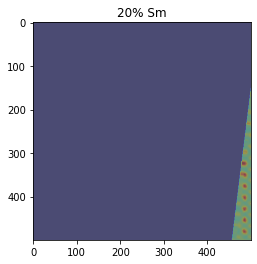

In [ ]:
for i in range(13):
  plt.imshow(images[i][0:500,0:500],cmap='jet')
  plt.imshow(plot_list_xy[i][0:500,0:500],cmap='gray_r', alpha=0.5)
  plt.imshow(plot_list_P[i][0:500,0:500],cmap='magma', alpha=0.4)
  plt.title(x_label_list[i])
  plt.show()

Extract subimages

Select few coordinates otherwise number of subimages will be too many.

In [ ]:
window_size=80

In [ ]:
xy_COM_all_select = []

for i in range(13):
  xy_sel_loc = xy_COM_all[i][::3]
  xy_COM_all_select.append(xy_sel_loc)

In [ ]:
Pxy_COM_all_select = []

for i in range(13):
  Pxy_sel_loc = Pxy_all[i][::3]
  Pxy_COM_all_select.append(Pxy_sel_loc)

In [ ]:
imstack_0, com_0, frames_0 = aoi.utils.extract_subimages(images[0], xy_COM_all_select[0], window_size=80)
imstack_1, com_1, frames_1 = aoi.utils.extract_subimages(images[1], xy_COM_all_select[1], window_size=80)
imstack_2, com_2, frames_2 = aoi.utils.extract_subimages(images[2], xy_COM_all_select[2], window_size=80)
imstack_3, com_3, frames_3 = aoi.utils.extract_subimages(images[3], xy_COM_all_select[3], window_size=80)
imstack_4, com_4, frames_4 = aoi.utils.extract_subimages(images[4], xy_COM_all_select[4], window_size=80)
imstack_5, com_5, frames_5 = aoi.utils.extract_subimages(images[5], xy_COM_all_select[5], window_size=80)
imstack_6, com_6, frames_6 = aoi.utils.extract_subimages(images[6], xy_COM_all_select[6], window_size=80)
imstack_7, com_7, frames_7 = aoi.utils.extract_subimages(images[7], xy_COM_all_select[7], window_size=80)
imstack_8, com_8, frames_8 = aoi.utils.extract_subimages(images[8], xy_COM_all_select[8], window_size=80)
imstack_9, com_9, frames_9 = aoi.utils.extract_subimages(images[9], xy_COM_all_select[9], window_size=80)
imstack_10, com_10, frames_10 = aoi.utils.extract_subimages(images[10], xy_COM_all_select[10], window_size=80)
imstack_11, com_11, frames_11 = aoi.utils.extract_subimages(images[11], xy_COM_all_select[11], window_size=80)
imstack_12, com_12, frames_12 = aoi.utils.extract_subimages(images[12], xy_COM_all_select[12], window_size=80)

In [ ]:
imstack_0.shape

(7939, 80, 80, 1)

In [ ]:
com_all = [com_0,com_1,com_2,com_3,com_4,com_5,com_6,com_7,com_8,com_9,com_10,com_11,com_12]

In [ ]:
imstack_all = [imstack_0, imstack_1, imstack_2, imstack_3, imstack_4, imstack_5, imstack_6, imstack_7, imstack_8, imstack_9, imstack_10, imstack_11, imstack_12]

In [ ]:
new_Pxy = []
for i in range(13):
  new_Pxy_loc = []
  for q in com_all[i]:
    tid = np.where(np.logical_and(xy_COM_all_select[i][:,0]==q[0], xy_COM_all_select[i][:,1]==q[1]))
    if tid[0].shape[0] > 0:
      new_Pxy_loc.append(Pxy_COM_all_select[i][tid[0][0]])
  new_Pxy.append(new_Pxy_loc)

In [ ]:
Pxy_arr = []

for i in range(13):
  Pxy_arry_loc = np.array(new_Pxy[i])
  Pxy_arr.append(Pxy_arry_loc)

Prepare training and test sets. 
Let's use the 0% Sm-doped BFO (Image 0) for training and the rest to test.
We keep the stack of subimages, coordinates, polarization values corresponding to each image separately in order to easily test our results afterwards.

In [ ]:
#choose the image and corresponding subimages to be used for training DCNN
img_id = 0
train_xy_format = xy_COM_all_select[img_id]
train_imstack_format = imstack_all[img_id]
train_pol_format = Pxy_arr[img_id]

Split into train and test sets:

In [ ]:
xy_test = train_xy_format[train_xy_format[:, 1] >= 2500]
xy_train = train_xy_format[train_xy_format[:, 1] < 2500]

imstack_test = train_imstack_format[train_xy_format[:, 1] >= 2500]
imstack_train = train_imstack_format[train_xy_format[:, 1] < 2500]

Pxy_weighted_test = train_pol_format[train_xy_format[:, 1] >= 2500]
Pxy_weighted_train = train_pol_format[train_xy_format[:, 1] < 2500]

Extra-processing (dimensionality and precision type)

In [ ]:
imstack_train = imstack_train[:, np.newaxis].astype(np.float32)
imstack_train = np.reshape(imstack_train,(imstack_train.shape[0],1,window_size, window_size))
imstack_test = imstack_test[:, np.newaxis].astype(np.float32)
imstack_test = np.reshape(imstack_test,(imstack_test.shape[0],1,window_size, window_size))
Pxy_weighted_train = Pxy_weighted_train.astype(np.float32)
Pxy_weighted_test = Pxy_weighted_test.astype(np.float32)

train_imstack_format = train_imstack_format[:, np.newaxis].astype(np.float32)
train_pol_format = train_pol_format.astype(np.float32)

print(train_imstack_format.shape)
print(train_pol_format.shape)

(7939, 1, 80, 80, 1)
(7939, 2)


Extra-processing (dimensionality and precision type)

In [ ]:
train_imstack_format = train_imstack_format[:, np.newaxis].astype(np.float32)
train_imstack_format = np.reshape(train_imstack_format,(train_imstack_format.shape[0],1,80,80))
train_pol_format = train_pol_format.astype(np.float32)

print(train_imstack_format.shape)
print(train_pol_format.shape)

(7939, 1, 80, 80)
(7939, 2)


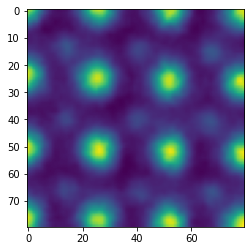

In [ ]:
plt.imshow(train_imstack_format[0,0,:,:])

Combined test set: list of all images that'll be used for testing later

In [ ]:
test_set_imstack = []
test_set_Pxy = []

for i in range(13):
  test_imstack = imstack_all[i][:, np.newaxis].astype(np.float32)
  test_imstack = np.reshape(test_imstack,(test_imstack.shape[0],1,80,80))
  test_pol = Pxy_arr[i].astype(np.float32)
  
  test_set_imstack.append(test_imstack)
  test_set_Pxy.append(test_pol)

In [ ]:
window_size = 80

Define a model and train network:

In [ ]:
mymodel = torch.nn.Sequential(
    ConvBlock(ndim=2, nb_layers=5, input_channels=1, kernel_size=3, output_channels=32, batch_norm=False, lrelu_a=0.1),
    nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 32, 64, batch_norm=False),
    nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 64, 128, batch_norm=False),
    nn.Flatten(),
    nn.Linear(128 * (window_size // 4)**2, 512),
    nn.LeakyReLU(),
    nn.Dropout(),
    nn.BatchNorm1d(512),
    nn.Linear(512, 2)
)

In [ ]:
train_new = False

if train_new:
    #initialtize trainer
    trainer = aoi.trainers.BaseTrainer()
    trainer.set_model(model)

    #The next three lines ensure that we start from the same state of the model every time
    
    aoi.utils.set_train_rng(3)
    trainer._reset_weights()
    trainer._reset_training_history()


    trainer.compile_trainer(
    (imstack_train, Pxy_weighted_train, imstack_test, Pxy_weighted_test), # training data 
    loss="mse", training_cycles=100, full_epoch=True, batch_size = 16, # training specs 
    filename = 'DCNN_model_img') # savename - adjust appropriately
    

else:
    !gdown https://drive.google.com/uc?id=1qhf8EMP_vFsPc52u446H9WtYuZ2my30i
    model_img0 = aoi.load_model("/content/filedir/model_0_C.tar")

In [ ]:
#load model
mymodel.load_state_dict(model_img0)

<All keys matched successfully>

Make prediction on full train and test stacks:

In [ ]:
p = aoi.predictors.BasePredictor(mymodel, use_gpu=True)
predictions_train = p.predict(imstack_train, out_shape=(2,), num_batches=16)
predictions_test = p.predict(imstack_test, out_shape=(2,), num_batches=16)

Plot ground truth

(-103.54513284846794, 4339.377696803912, -166.5983453591681, 4461.527403730303)

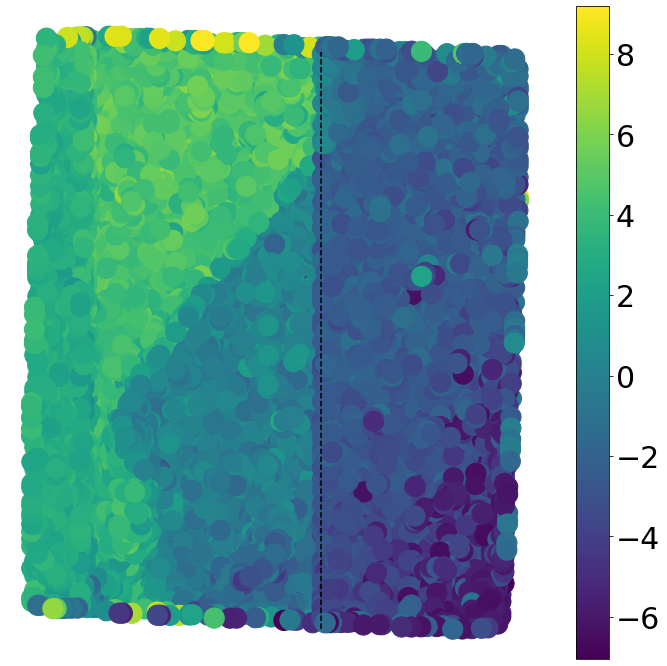

In [ ]:
plt.figure(figsize=(12,12))
plt.scatter(xy_train[:, 1], xy_train[:, 0], c=Pxy_weighted_train[:, 0], s= 410)
plt.scatter(xy_test[:, 1], xy_test[:, 0], c=Pxy_weighted_test[:, 0], s=410)
plt.vlines(2500, xy_test[:, 0].min(), xy_test[:, 1].max(), linestyle='--')
cb = plt.colorbar()
font_size = 30 # Adjust as appropriate.
cb.ax.tick_params(labelsize=font_size)

plt.axis('off')

Plot predictions

(-103.54513284846794, 4339.377696803912, -166.5983453591681, 4461.527403730303)

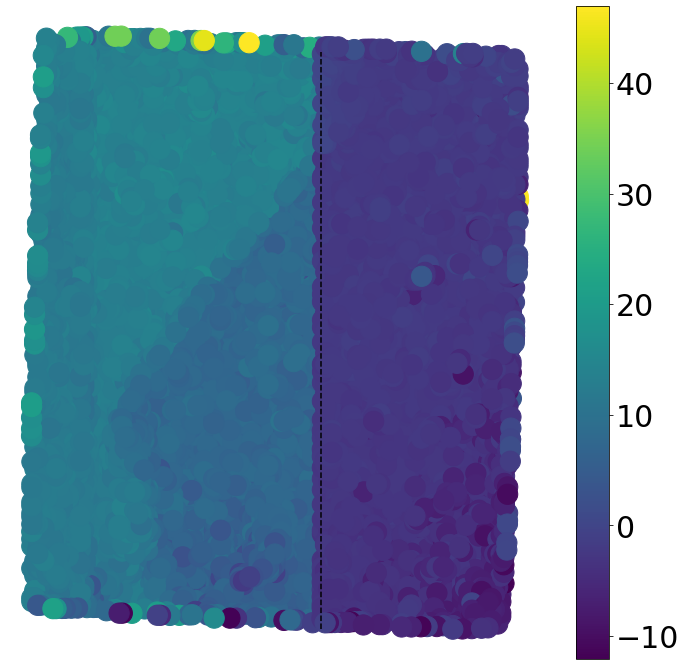

In [ ]:
plt.figure(figsize=(12,12))
plt.scatter(xy_train[:, 1], xy_train[:, 0], c=predictions_train[:, 0], s= 410)
plt.scatter(xy_test[:, 1], xy_test[:, 0], c=predictions_test[:, 0], s=410)
plt.vlines(2500, xy_test[:, 0].min(), xy_test[:, 1].max(), linestyle='--')
cb = plt.colorbar()
font_size = 30 # Adjust as appropriate.
cb.ax.tick_params(labelsize=font_size)

plt.axis('off')

Plot error:

(-103.54513284846794, 4339.377696803912, -166.5983453591681, 4461.527403730303)

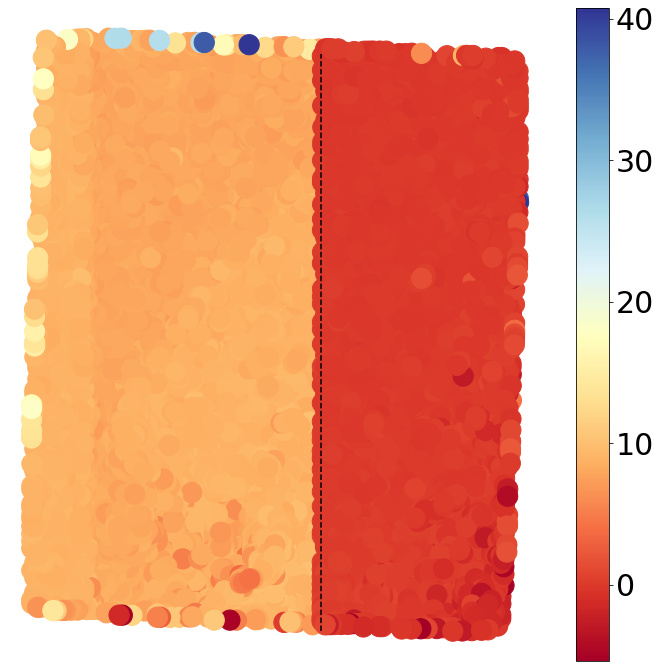

In [ ]:
plt.figure(figsize=(12,12))

plt.scatter(xy_train[:, 1], xy_train[:, 0],
            c=predictions_train[:, 0] - Pxy_weighted_train[:, 0], s=410,
            cmap='RdYlBu')
plt.scatter(xy_test[:, 1], xy_test[:, 0],
            c=predictions_test[:, 0] - Pxy_weighted_test[:, 0], s=410,
            cmap='RdYlBu')
plt.vlines(2500, xy_test[:, 0].min(), xy_test[:, 1].max(), linestyle='--')
cb = plt.colorbar()
font_size = 30 # Adjust as appropriate.
cb.ax.tick_params(labelsize=font_size)

plt.axis('off')

In [ ]:
#performance on all images
predictions_all_test = []
for i in range(13):
  predictions_test_loc = p.predict(test_set_imstack[i], out_shape=(2,), num_batches=16)
  predictions_test_loc = predictions_test_loc.numpy()
  predictions_all_test.append(predictions_test_loc)

In [ ]:
x_label_list = ['0% Sm', '0% Sm', '0% Sm', '7% Sm', '7% Sm', '7% Sm', '7% Sm', '10% Sm', '10% Sm', '13% Sm', '13% Sm', '20% Sm', '20% Sm'] 

Plot predicted vs. real:

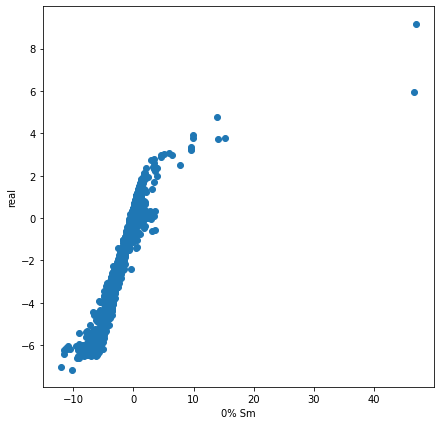

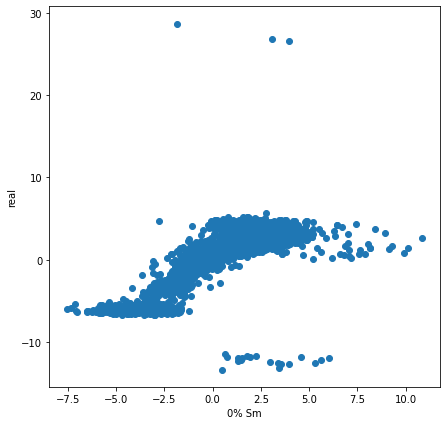

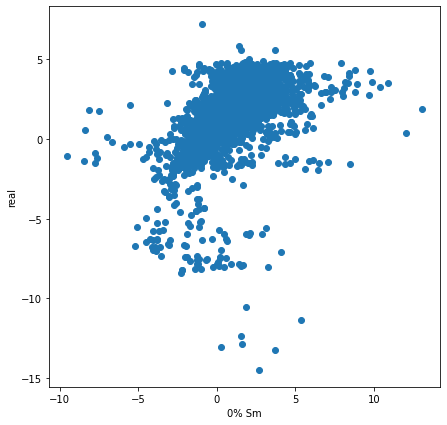

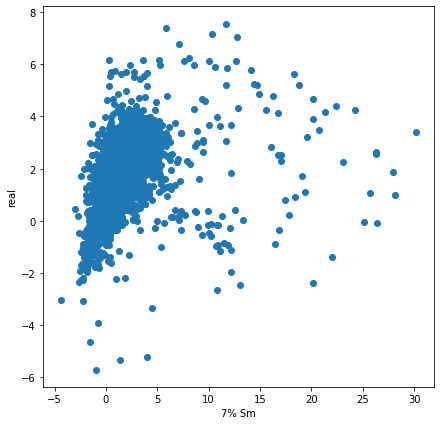

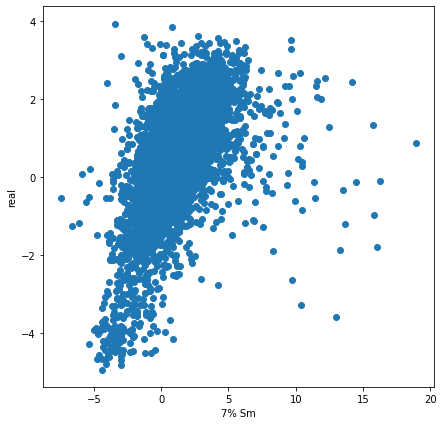

...

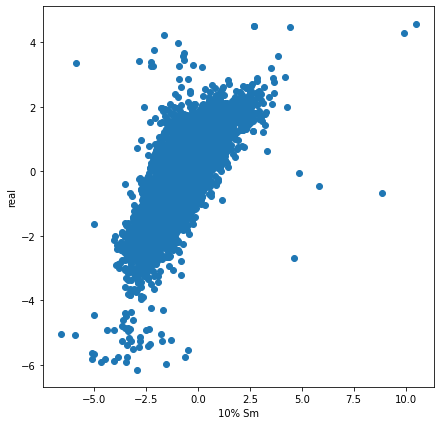

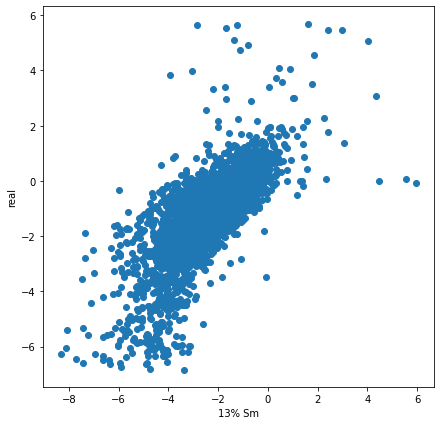

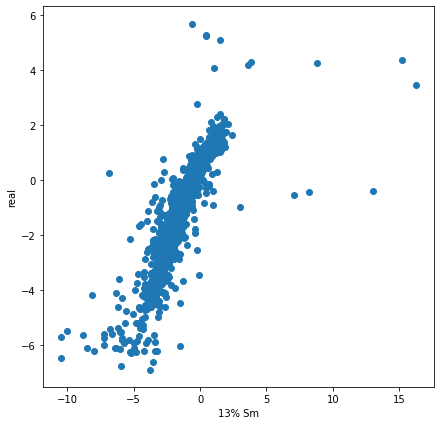

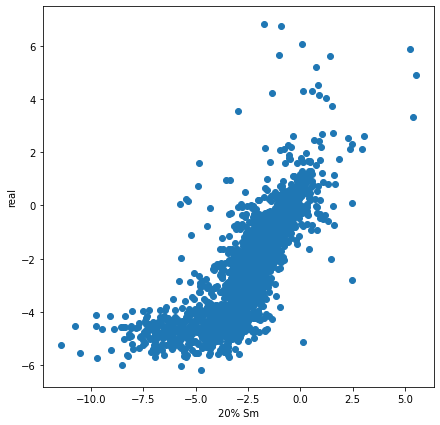

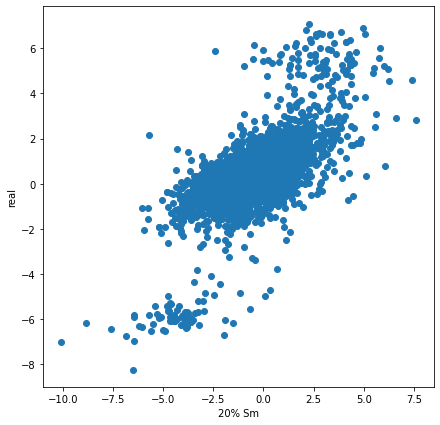

In [ ]:
for i in range(13):

  plt.figure(figsize=(7,7))
  plt.scatter(predictions_all_test[i][:, 0], test_set_Pxy[i][:, 0])
  plt.xlabel(x_label_list[i])
  plt.ylabel("real")
  plt.show()

Feature Maps:

Helpful to show how the input is transformed passing through the convolution layers. 

Once an input image is passed through specific block, layer and filters, the immidiate activations are recorded which are plotted to see the corresponding encoded features.



In [ ]:
## utility function
def preprocess_data(im):
    
    if isinstance(im, np.ndarray):
      im = torch.from_numpy(im).float()
    im_as_var = Variable(im, requires_grad=True)
    return im_as_var

def recreate_data(im_as_var):
    
    recreated_im = copy.copy(im_as_var.data.numpy())
    return recreated_im

In [ ]:
class AoiFeatMap():

  def __init__(self, model,):
    self.model = model
    self.model.eval()
    self.featmap_img = []
    

  def generate_feature_maps(self, inImage ):
    
    # Process image and return pytorch variable
    processed_image = preprocess_data(inImage)    
    x = processed_image
    
    for id1, layer1 in enumerate(self.model):
      ## these are hardcoded layer ids very specific to the current aoi model architecture
      if id1 == 5:
        #don't proceed beyond the conv layers or a specific break point have been reached
        break
      #specifically for the outer conv block, go inside them
      if id1 in [0,2,4]:
        for id2, layer2 in enumerate(layer1.block):
          x = layer2(x)
          #store image only for only the Conv layers, in this model they are the even layers
          if id2%2 == 0:
            self.featmap_img.append(recreate_data(x[0]))
      else:
        x = layer1(x)

In [ ]:
mymodel = torch.nn.Sequential(
    ConvBlock(ndim=2, nb_layers=5, input_channels=1, kernel_size=3, output_channels=32, batch_norm=False, lrelu_a=0.1),
    nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 32, 64, batch_norm=False),
    nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 64, 128, batch_norm=False),
    nn.Flatten(),
    nn.Linear(128 * (window_size // 4)**2, 512),
    nn.LeakyReLU(),
    nn.Dropout(),
    nn.BatchNorm1d(512),
    nn.Linear(512, 2)
)

In [ ]:
#load model
mymodel.load_state_dict(model_img0)

<All keys matched successfully>

In [ ]:
#any pre-trianed model can be used here. 

model0_feat_map = AoiFeatMap(mymodel)

In [ ]:
#choosing the subimage that we would like to see the feature maps of

model0_feat_map.generate_feature_maps(train_imstack_format[7938:7939])

In [ ]:
first_layer = model0_feat_map.featmap_img[0]
sec_layer = model0_feat_map.featmap_img[1]
third_layer = model0_feat_map.featmap_img[2]
fourth_layer = model0_feat_map.featmap_img[3]
fifth_layer = model0_feat_map.featmap_img[4]
sixth_layer = model0_feat_map.featmap_img[5]
seventh_layer = model0_feat_map.featmap_img[6]
eight_layer = model0_feat_map.featmap_img[7]
ninth_layer = model0_feat_map.featmap_img[8]

<Figure size 432x288 with 0 Axes>

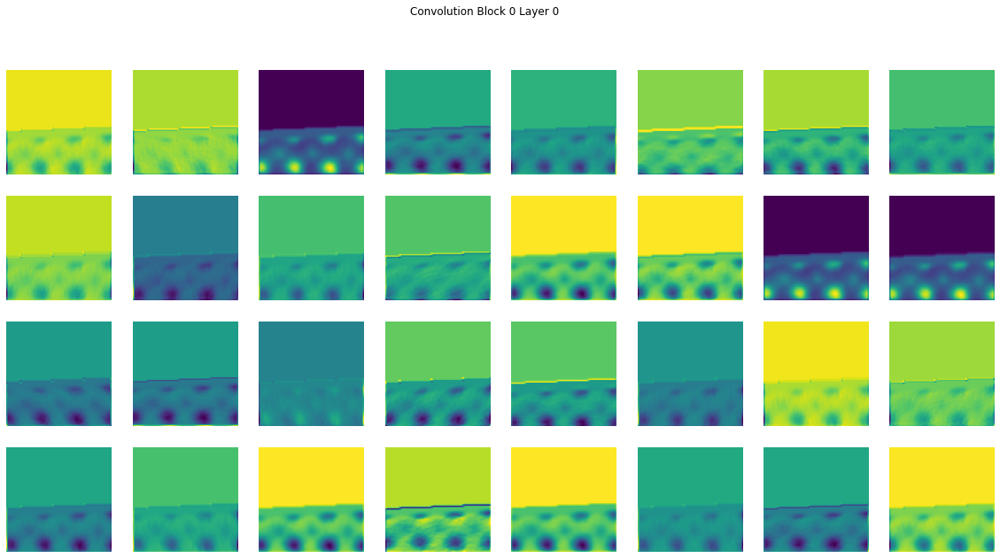

In [ ]:
plt.figure(0)

plt.figure(figsize=(20,10))
plots = []
for i in range(4):
    for j in range(8):
        ax = plt.subplot2grid((4,8), (i,j))
        ax.imshow(first_layer[i*8+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 0 Layer 0')
plt.show()

<Figure size 432x288 with 0 Axes>

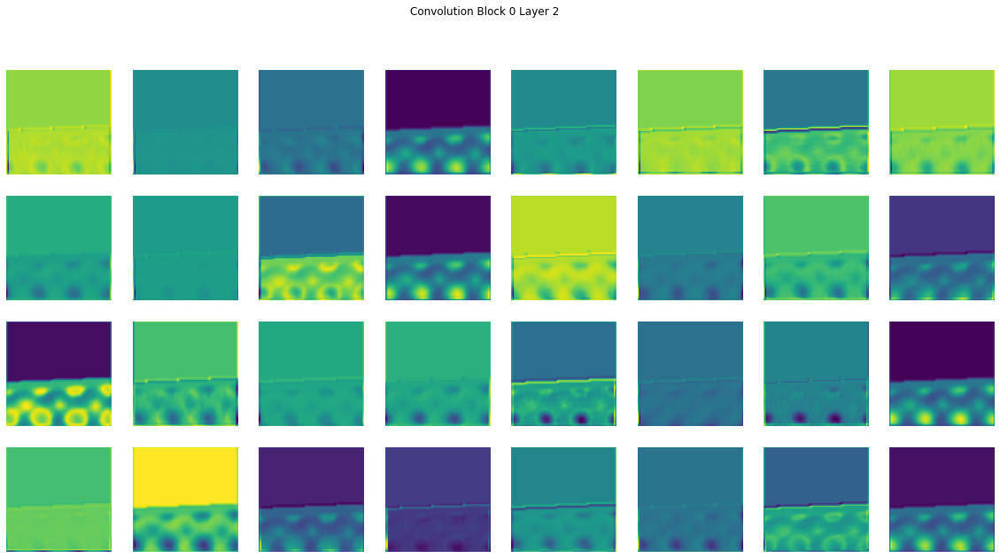

In [ ]:
plt.figure(1)
plt.figure(figsize=(20,10))

plots = []
for i in range(4):
    for j in range(8):
        ax = plt.subplot2grid((4,8), (i,j))
        ax.imshow(sec_layer[i*8+j,:,:])
        ax.axis('off')
        plt.suptitle('Convolution Block 0 Layer 2')
plt.show()

<Figure size 432x288 with 0 Axes>

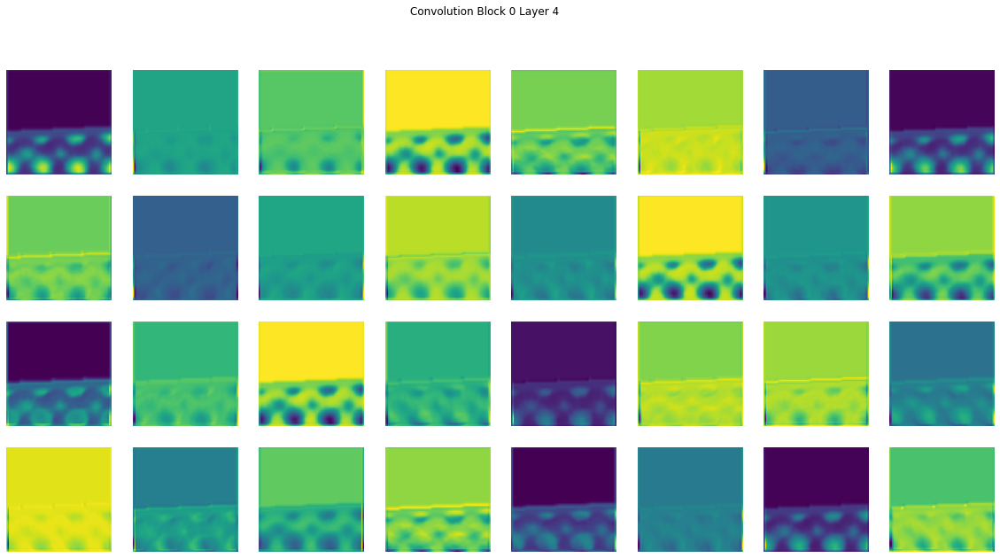

In [ ]:
plt.figure(0)
plt.figure(figsize=(20,10))

plots = []
for i in range(4):
    for j in range(8):
        ax = plt.subplot2grid((4,8), (i,j))
        ax.imshow(third_layer[i*8+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 0 Layer 4')
plt.show()

<Figure size 432x288 with 0 Axes>

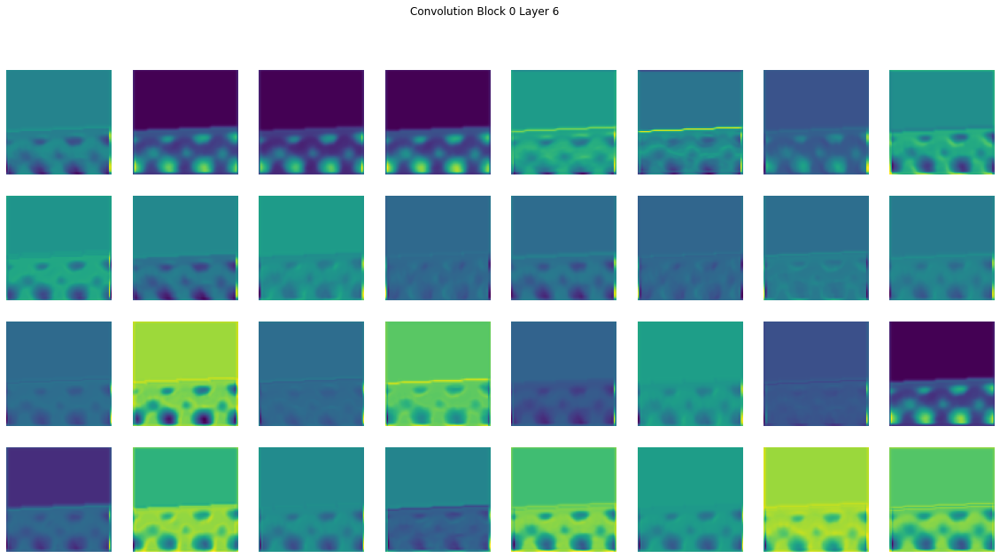

In [ ]:
plt.figure(0)
plt.figure(figsize=(20,10))

plots = []
for i in range(4):
    for j in range(8):
        ax = plt.subplot2grid((4,8), (i,j))
        ax.imshow(fourth_layer[i*8+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 0 Layer 6')
plt.show()

<Figure size 432x288 with 0 Axes>

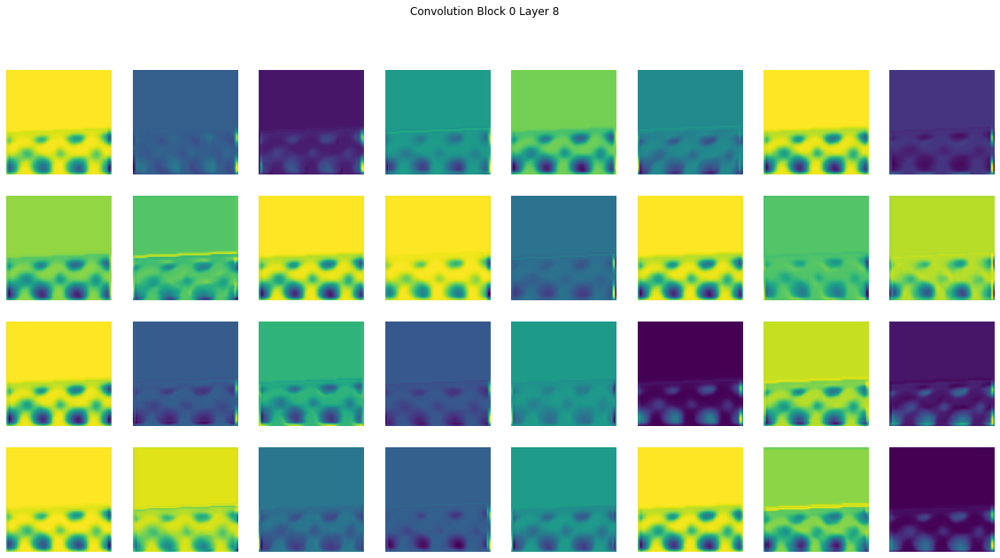

In [ ]:
plt.figure(0)
plt.figure(figsize=(20,10))

plots = []
for i in range(4):
    for j in range(8):
        ax = plt.subplot2grid((4,8), (i,j))
        ax.imshow(fifth_layer[i*8+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 0 Layer 8')
plt.show()

<Figure size 432x288 with 0 Axes>

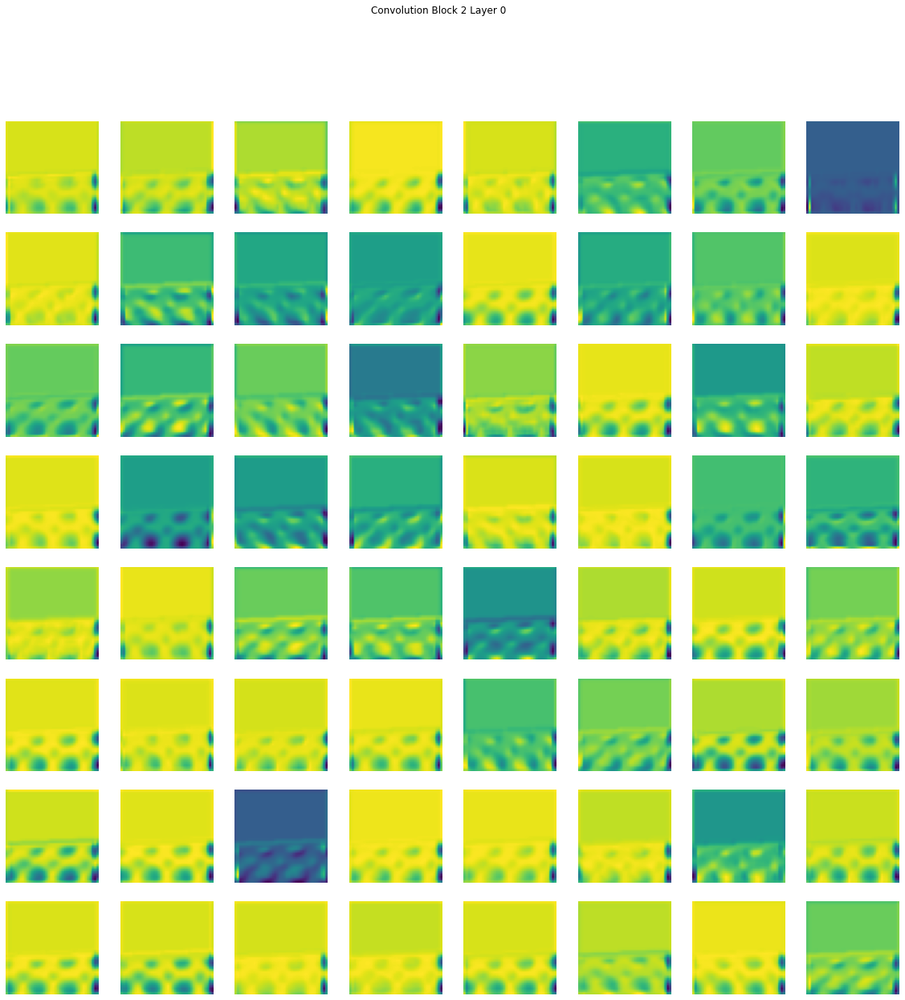

In [ ]:
plt.figure(0)
plt.figure(figsize=(20,20))

plots = []
for i in range(8):
    for j in range(8):
        ax = plt.subplot2grid((8,8), (i,j))
        ax.imshow(sixth_layer[i*8+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 2 Layer 0')
plt.show()

<Figure size 432x288 with 0 Axes>

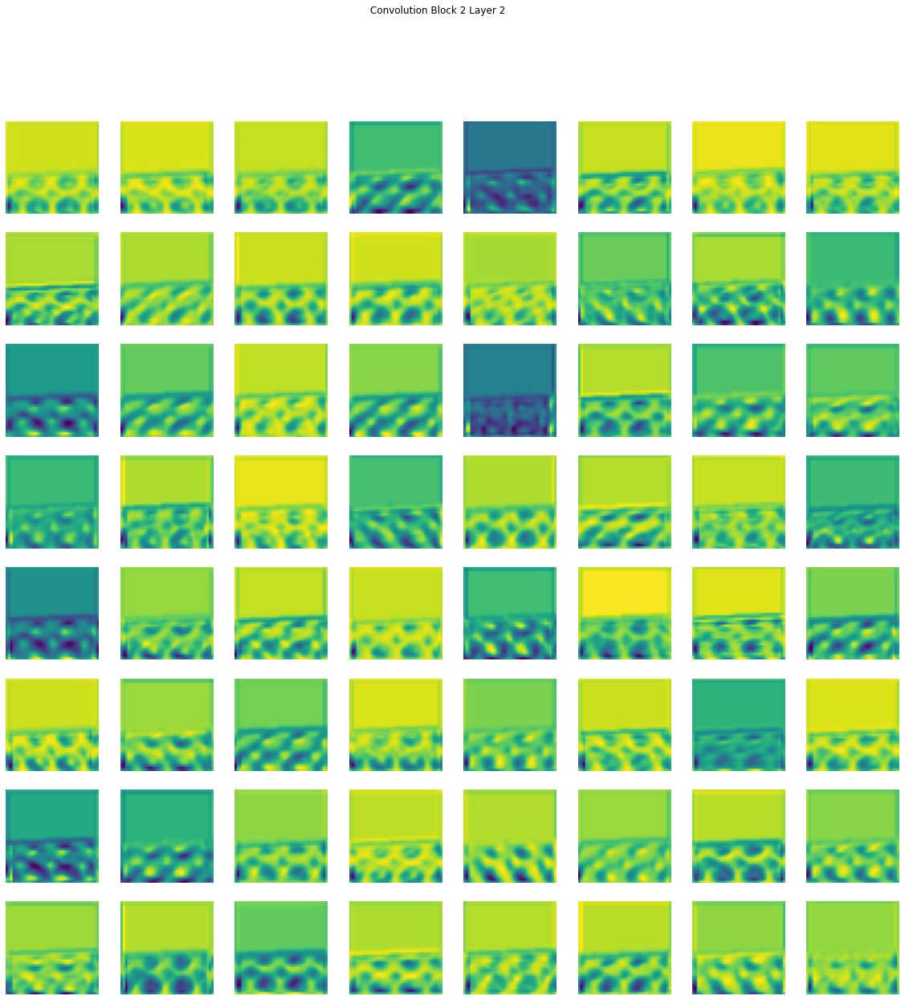

In [ ]:
plt.figure(0)
plt.figure(figsize=(20,20))

plots = []
for i in range(8):
    for j in range(8):
        ax = plt.subplot2grid((8,8), (i,j))
        ax.imshow(seventh_layer[i*8+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 2 Layer 2')
plt.show()

<Figure size 432x288 with 0 Axes>

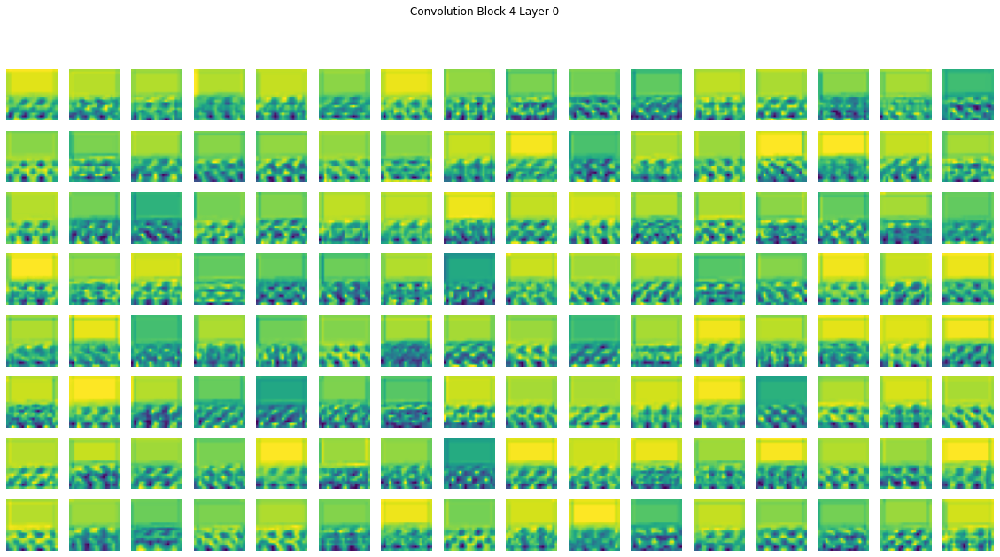

In [ ]:
plt.figure(0)
plt.figure(figsize=(20,10))

plots = []
for i in range(8):
    for j in range(16):
        ax = plt.subplot2grid((8,16), (i,j))
        ax.imshow(eight_layer[i*16+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 4 Layer 0')
plt.show()

<Figure size 432x288 with 0 Axes>

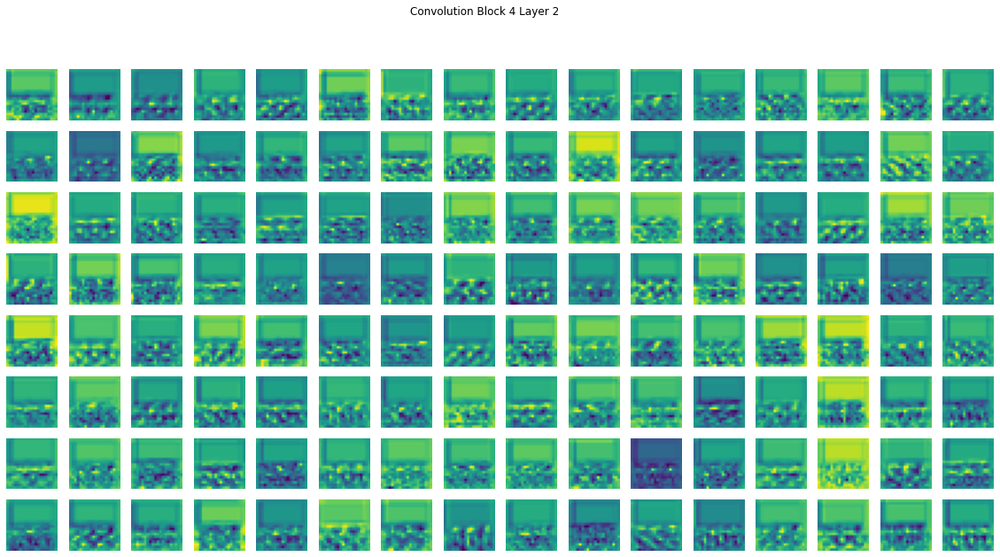

In [ ]:
plt.figure(0)
plt.figure(figsize=(20,10))

plots = []
for i in range(8):
    for j in range(16):
        ax = plt.subplot2grid((8,16), (i,j))
        ax.imshow(ninth_layer[i*16+j,:,:])
        ax.axis('off')
plt.suptitle('Convolution Block 4 Layer 2')
plt.show()

In [ ]:
class AoiCNNLayerViz():

  def __init__(self, model,selected_block, selected_layer, selected_filter):
    self.model = model
    self.model.eval()
    self.selected_block = selected_block
    self.selected_layer = selected_layer
    self.selected_filter = selected_filter
    self.conv_output = 0
    self.layerviz_list = []

  def visualize_layer_without_hooks(self, inImage, ntr=50, istep=5, ):
    # Generate a random image
    if inImage=='random':
      random_image = np.uint8(np.random.uniform(150, 180, (1, 1, 80, 80)))
      print("staring with random image")
    else:
      random_image = inImage # make sure the inImage is of shape (1,1,80,80)
      print("staring with provided image")

    # Process image and return pytorch variable
    processed_image = preprocess_data(random_image)

    # Define optimizer for the image
    optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-6)

    for i in range(1, ntr):
      optimizer.zero_grad()
      # Assign create image to a variable to move forward in the model
      x = processed_image
      innerBreak = False
      for id1, layer1 in enumerate(self.model):
        ## these are hardcoded layer ids very specific to the current aoi model architecture
        if id1 == 5 or innerBreak:
          #don't proceed beyond the conv layers or a specific break point have been reached
          break
        #specificly for the outer conv block, go inside them
        if id1 in [0,2,4]:
          for id2, layer2 in enumerate(layer1.block):
            x = layer2(x)
            if id1 == self.selected_block and id2 == self.selected_layer:
              #Only need to forward until the selected layer is reached
              innerBreak = True
              break
        else:
          x = layer1(x)
      #Now, x is the output of the selected layer
      #pick the specific filter from x that we want top target
      self.conv_output = x[0, self.selected_filter]
      # Loss function is the mean of the output of the selected layer/filter
      # We try to minimize the mean of the output of that specific filter
      loss = -torch.mean(self.conv_output)
      print('Iteration:', str(i), 'Loss:', "{0:.2f}".format(loss.data.numpy()))
      # Backward
      loss.backward()
      # Update image
      optimizer.step()
      # Recreate image
      created_image = recreate_data(processed_image)
      #save the recreated image every istep intervals
      if i % istep == 0:
        self.layerviz_list.append(created_image)     

In [ ]:
#define model
mymodel = torch.nn.Sequential(
    ConvBlock(ndim=2, nb_layers=5, input_channels=1, kernel_size=3, output_channels=32, batch_norm=False, lrelu_a=0.1),
    nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 32, 64, batch_norm=False),
    nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 64, 128, batch_norm=False),
    nn.Flatten(),
    nn.Linear(128 * (window_size // 4)**2, 512),
    nn.LeakyReLU(),
    nn.Dropout(),
    nn.BatchNorm1d(512),
    nn.Linear(512, 2)
)

In [ ]:
#load model
mymodel.load_state_dict(model_img0)

<All keys matched successfully>

In [ ]:
aoiviz_conv_block_0 = AoiCNNLayerViz(mymodel, 0, 8, 31) #visualizing filter 31 of layer 8 of block 4
aoiviz_conv_block_2 = AoiCNNLayerViz(mymodel, 2, 2, 63) #visualizing filter 63 of layer 2 of block 2
aoiviz_conv_block_4 = AoiCNNLayerViz(mymodel, 4, 2, 127) #visualizing filter 127 of layer 2 of block 4

In [ ]:
aoiviz_conv_block_0.visualize_layer_without_hooks( "random", ntr=1000, istep=100)
aoiviz_conv_block_2.visualize_layer_without_hooks( "random", ntr=1000, istep=100)
aoiviz_conv_block_4.visualize_layer_without_hooks( "random", ntr=1000, istep=100)

staring with random image
Iteration: 1 Loss: -87214.76
Iteration: 2 Loss: -87267.73
Iteration: 3 Loss: -87320.69
Iteration: 4 Loss: -87373.66
Iteration: 5 Loss: -87426.62
Iteration: 6 Loss: -87479.59
Iteration: 7 Loss: -87532.56
Iteration: 8 Loss: -87585.53
Iteration: 9 Loss: -87638.49
Iteration: 10 Loss: -87691.46
Iteration: 11 Loss: -87744.42
Iteration: 12 Loss: -87797.39
Iteration: 13 Loss: -87850.36
Iteration: 14 Loss: -87903.32
Iteration: 15 Loss: -87956.29
Iteration: 16 Loss: -88009.25
Iteration: 17 Loss: -88062.22
Iteration: 18 Loss: -88115.18
Iteration: 19 Loss: -88168.15
Iteration: 20 Loss: -88221.12
Iteration: 21 Loss: -88274.10
Iteration: 22 Loss: -88327.05
Iteration: 23 Loss: -88380.03
Iteration: 24 Loss: -88432.99
Iteration: 25 Loss: -88485.96
Iteration: 26 Loss: -88538.92
Iteration: 27 Loss: -88591.89
Iteration: 28 Loss: -88644.85
Iteration: 29 Loss: -88697.82
Iteration: 30 Loss: -88750.78
Iteration: 31 Loss: -88803.75
Iteration: 32 Loss: -88856.72
Iteration: 33 Loss: -88

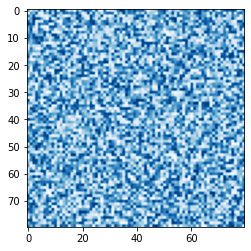

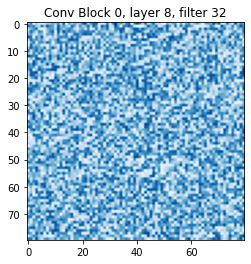

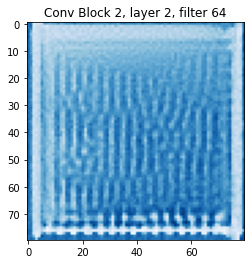

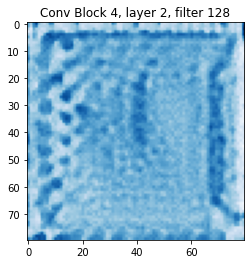

In [ ]:
plt.imshow(np.uint8(np.random.uniform(150, 180, (80, 80))), cmap='Blues')
plt.show()
plt.imshow(aoiviz_conv_block_0.layerviz_list[8][0,0], cmap='Blues')
plt.title('Conv Block 0, layer 8, filter 32')
plt.show()
plt.imshow(aoiviz_conv_block_2.layerviz_list[8][0,0], cmap='Blues')
plt.title('Conv Block 2, layer 2, filter 64')
plt.show()
plt.imshow(aoiviz_conv_block_4.layerviz_list[8][0,0], cmap='Blues')
plt.title('Conv Block 4, layer 2, filter 128')
plt.show()